## Enzyme Kinetics in a NON Michaelis-Menten modality
#### 3 Coupled Reactions: `S <-> P` , `E + S <-> ES*`, and  `ES* <-> E + P` .  Variation of experiment enzyme_3   
A direct reaction and the same reaction, catalyzed and showing the intermediate state.  
Re-run from same initial concentrations of S ("Substrate") and P ("Product"), for various concentations of the enzyme `E`: from zero to hugely abundant 
### We'll REJECT the customary Michaelis-Menten assumptions that [E] << [S] and that the rates satisfy k1_reverse >> k2_forward !   
#### We'll explore exotic scenarios with lavish amount of enzyme, leading to diminishing (though fast-produced!) products,  and a buildup of the (not-so-transient!) ES* intermediate

LAST REVISED: June 14, 2024 (using v. 1.0 beta33)

In [1]:
import set_path      # Importing this module will add the project's home directory to sys.path

Added 'D:\Docs\- MY CODE\BioSimulations\life123-Win7' to sys.path


In [2]:
from experiments.get_notebook_info import get_notebook_basename

from src.modules.chemicals.chem_data import ChemData
from src.modules.reactions.uniform_compartment import UniformCompartment
from src.modules.movies.movies import MovieTabular
from src.modules.visualization.graphic_log import GraphicLog

import pandas as pd

In [3]:
# Initialize the HTML logging
log_file = get_notebook_basename() + ".log.htm"    # Use the notebook base filename for the log file

# Set up the use of some specified graphic (Vue) components
GraphicLog.config(filename=log_file,
                  components=["vue_cytoscape_2"],
                  extra_js="https://cdnjs.cloudflare.com/ajax/libs/cytoscape/3.21.2/cytoscape.umd.js")

-> Output will be LOGGED into the file 'enzyme_4.log.htm'


In [4]:
# Initialize the system
chem_data = ChemData(names=["S", "P", "E", "ES*"])
                                                     
# Reaction S <-> P , with 1st-order kinetics, favorable thermodynamics in the forward direction, 
# and a forward rate that is much slower than it would be with the enzyme - as seen in the next reaction, below
chem_data.add_reaction(reactants="S", products="P",
                       forward_rate=1., delta_G=-3989.73)

     
# Reaction E + S <-> ES* , with 1st-order kinetics, and a forward rate that is much faster than it was without the enzyme
# Thermodynamically, the forward direction is at a disadvantage (higher energy state) because of the activation barrier in forming the transient state ES*
chem_data.add_reaction(reactants=["E", "S"], products=["ES*"],
                       forward_rate=100., delta_G=2000)                           
                                                      
# Reaction ES* <-> E + P , with 1st-order kinetics, and a forward rate that is much faster than it was without the enzyme
# Thermodynamically, the total energy change of this reaction and the previous one adds up to the same value as the reaction without the enzyme (-3989.73)
chem_data.add_reaction(reactants=["ES*"], products=["E", "P"],
                       forward_rate=200., delta_G=-5989.73)

# NOTE: the forward_rate's of the last 2 reactions (the catalyzed ones) were tweaked, 
#       to lead to a crossover point [S] = [P] at about the same time as in experiment `enzyme3`, in step 2 (when [E] = 0.2)

chem_data.describe_reactions()

# Send the plot of the reaction network to the HTML log file
chem_data.plot_reaction_network("vue_cytoscape_2")

Number of reactions: 3 (at temp. 25 C)
0: S <-> P  (kF = 1 / kR = 0.2 / delta_G = -3,989.7 / K = 5) | 1st order in all reactants & products
1: E + S <-> ES*  (kF = 100 / kR = 224.07 / delta_G = 2,000 / K = 0.44629) | 1st order in all reactants & products
2: ES* <-> E + P  (kF = 200 / kR = 17.851 / delta_G = -5,989.7 / K = 11.204) | 1st order in all reactants & products
Set of chemicals involved in the above reactions: {'ES*', 'P', 'S', 'E'}
[GRAPHIC ELEMENT SENT TO LOG FILE `enzyme_4.log.htm`]


Note that `E` is not labeled as an "enzyme" because it doesn't appear as a catalyst in any of the registered reactions; it only becomes an enzyme in the context of the _compound_ reaction from (2) and (3)

# 1. Set the initial concentrations of all the chemicals - starting with no enzyme

In [5]:
dynamics = UniformCompartment(chem_data=chem_data, preset="mid")
dynamics.set_conc(conc={"S": 20.},  snapshot=True)      # Initially, no enzyme `E`
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


### Advance the reactions (for now without enzyme) to equilibrium

In [6]:
#dynamics.set_diagnostics()       # To save diagnostic information about the call to single_compartment_react()

# Perform the reactions
dynamics.single_compartment_react(duration=4.0,
                                  initial_step=0.1, variable_steps=True, explain_variable_steps=False)

27 total step(s) taken


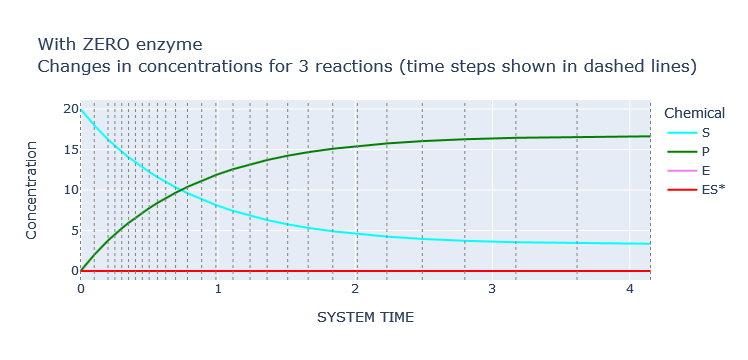

In [7]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, title_prefix="With ZERO enzyme")

### The reactions, lacking enzyme, are proceeding slowly towards equilibrium, just like the reaction that was discussed in part 1 of the experiment "enzyme_1"

In [8]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(tolerance=2)

0: S <-> P
Final concentrations: [S] = 3.37 ; [P] = 16.63
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.93491
    Formula used:  [P] / [S]
2. Ratio of forward/reverse reaction rates: 5.00001
Discrepancy between the two values: 1.302 %
Reaction IS in equilibrium (within 2% tolerance)

1: E + S <-> ES*
Final concentrations: [E] = 0 ; [S] = 3.37 ; [ES*] = 0
Reaction IS in equilibrium because it can't proceed in either direction due to zero concentrations in both some reactants and products!

2: ES* <-> E + P
Final concentrations: [ES*] = 0 ; [E] = 0 ; [P] = 16.63
Reaction IS in equilibrium because it can't proceed in either direction due to zero concentrations in both some reactants and products!



True

In [9]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=1.0)

(0.7322948238817497, 10.0)

In [10]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
27,4.150766,0.0,0.0,16.630111


In [11]:
P_equil = dynamics.get_chem_conc("P")
P_equil

16.63011072773748

In [12]:
P_70_threshold = P_equil * 0.70
P_70_threshold

11.641077509416236

In [13]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.9536647543782931

# 2. Re-start all the reactions from the same initial concentrations - except for now having a tiny amount of enzyme (two orders of magnitude less than the starting [S])

In [14]:
E_init = 0.2     # A tiny bit of enzyme `E`: 1/100 of the initial [S]

In [15]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init},
                  snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.2
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [16]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=1.3,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
1476 total step(s) taken


In [17]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

In [18]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=1.0)

(0.24856557905040474, 9.926581378605173)

plot_curves() WARNING: Excessive number of vertical lines (1477) - only showing 1 every 10 lines


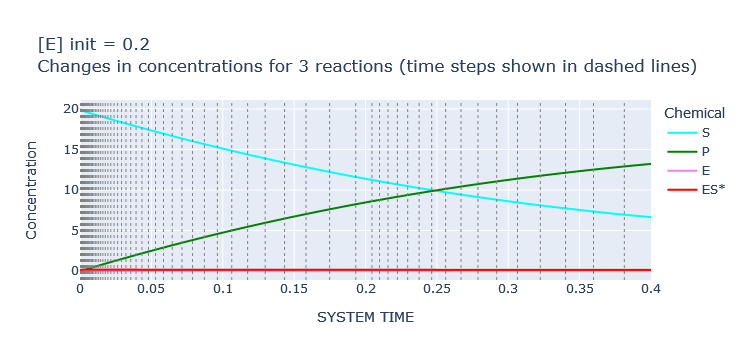

In [19]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}", xrange=[0, 0.4])

In [20]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.4)

(0.24856557905040474, 9.926581378605173)

### Now, let's investigate E and ES* in the very early times

## Notice how even a tiny amount of enzyme (1/100 of the initial [S])  makes a very pronounced difference!

plot_curves() WARNING: Excessive number of vertical lines (1477) - only showing 1 every 10 lines


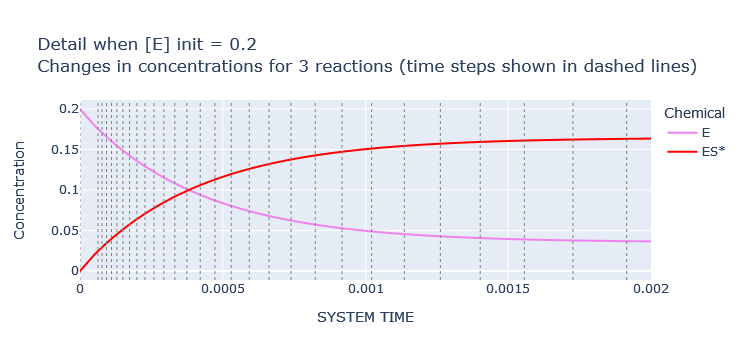

In [21]:
#The very early part of the reaction
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"Detail when [E] init = {E_init}", xrange=[0, 0.002])

### Notice how, with this small initial concentration of [E], the timescale of [E] and [ES*] is vastly faster than that of [P] and [S]

plot_curves() WARNING: Excessive number of vertical lines (1477) - only showing 1 every 10 lines


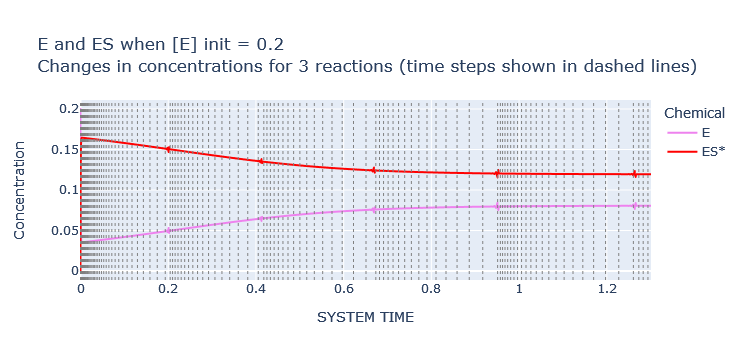

In [22]:
# The full reaction of E and ES*
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"E and ES when [E] init = {E_init}")

Notice how at every onset of instability in [E] or [ES*], the adaptive time steps shrink down

In [23]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
1476,1.30085,0.080546,0.119454,16.544949


Interestingly, most of the inital [E] of 0.2 is now, at equilibrium, stored as [ES*]=0.119; the energy of the "activation barrier" from E + S to ES* might be unrealistically low (2000 Joules).  Zooming in on the very earl part of the plot:

In [24]:
P_equil = dynamics.get_chem_conc("P")
P_equil

16.54494887428722

In [25]:
P_70_threshold = P_equil * 0.70
P_70_threshold

11.581464212001052

In [26]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.31446597160581014

# 3. Repeat last step with increasingly-larger initial [E]

In [27]:
E_init = 0.4

In [28]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init},
                  snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 0.4
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [29]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=1.0,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
1211 total step(s) taken


In [30]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (1212) - only showing 1 every 9 lines


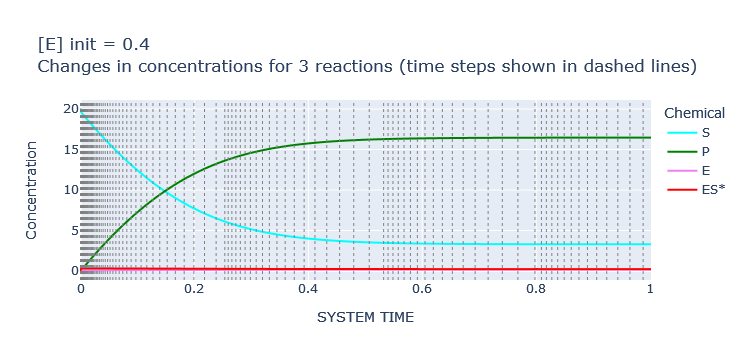

In [31]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [32]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.4)

(0.1480911200305407, 9.85341706705381)

Notice how the timescale of [S] and [P] is becoming faster with a higher initial [E]

plot_curves() WARNING: Excessive number of vertical lines (1212) - only showing 1 every 9 lines


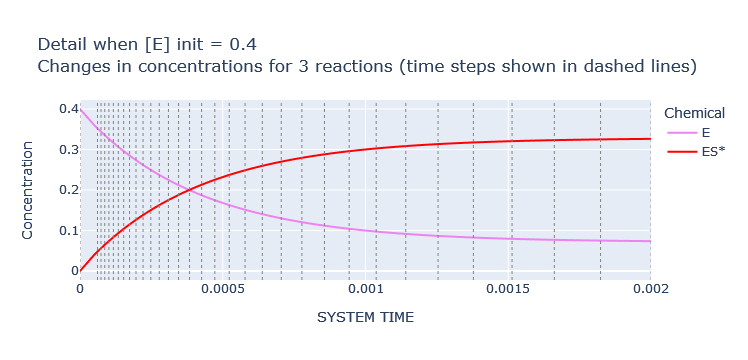

In [33]:
#The very early part of the reaction
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"Detail when [E] init = {E_init}", xrange=[0, 0.002])

plot_curves() WARNING: Excessive number of vertical lines (1212) - only showing 1 every 9 lines


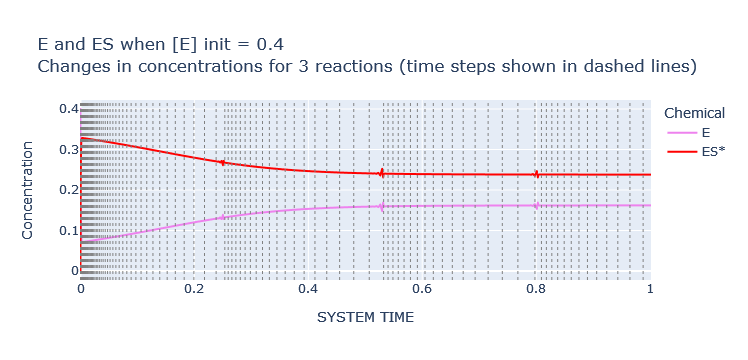

In [34]:
# The full reaction of E and ES*
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"E and ES when [E] init = {E_init}")

In [35]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
1211,1.00161,0.161931,0.238069,16.466878


In [36]:
P_equil = dynamics.get_chem_conc("P")
P_equil

16.466877520220297

#### P_equil continues to decrease with increasing initial [E]

In [37]:
P_70_threshold = P_equil * 0.70
P_70_threshold

11.526814264154208

In [38]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.18680188203718445

#### The time at which the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# 4. Keep increasing the initial [E]

In [39]:
E_init = 1.0

In [40]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init}, snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 1.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [41]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=0.4,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
866 total step(s) taken


In [42]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (867) - only showing 1 every 6 lines


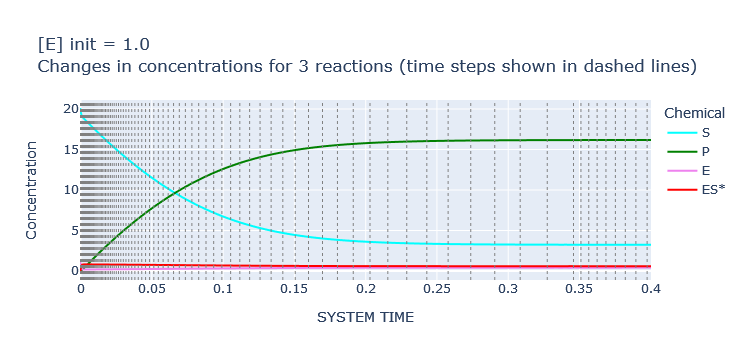

In [43]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [44]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.4)

(0.06628340509848926, 9.635470546269993)

The timescale of [S] and [P] continues to become faster with a higher initial [E]

plot_curves() WARNING: Excessive number of vertical lines (867) - only showing 1 every 6 lines


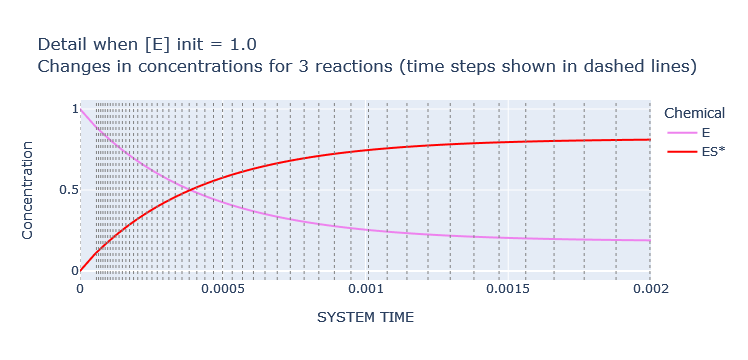

In [45]:
#The very early part of the reaction
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"Detail when [E] init = {E_init}", xrange=[0, 0.002])

plot_curves() WARNING: Excessive number of vertical lines (867) - only showing 1 every 6 lines


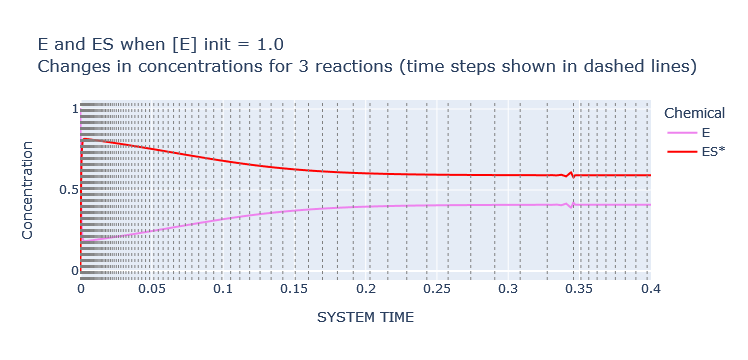

In [46]:
# The full reaction of E and ES*
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"E and ES when [E] init = {E_init}")

In [47]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
866,0.400158,0.409128,0.590872,16.1715


In [48]:
P_equil = dynamics.get_chem_conc("P")
P_equil

16.171500029051185

#### P_equil continues to decrease with increasing initial [E]

In [49]:
P_70_threshold = P_equil * 0.70
P_70_threshold

11.32005002033583

In [50]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.08364939325100468

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# 5. Keep increasing the initial [E]

In [51]:
E_init = 2.0      # 1/10 of the initial [S]

In [52]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init}, snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 2.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [53]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=0.2,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
818 total step(s) taken


In [54]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (819) - only showing 1 every 6 lines


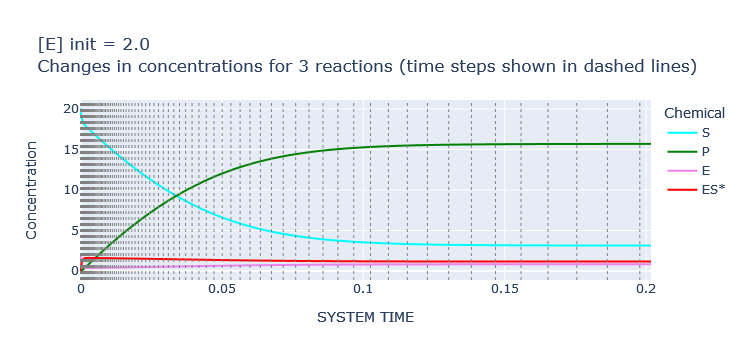

In [55]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [56]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.4)

(0.033892638379102225, 9.277504597225233)

The timescale of [S] and [P] continues to become faster with a higher initial [E]

plot_curves() WARNING: Excessive number of vertical lines (819) - only showing 1 every 6 lines


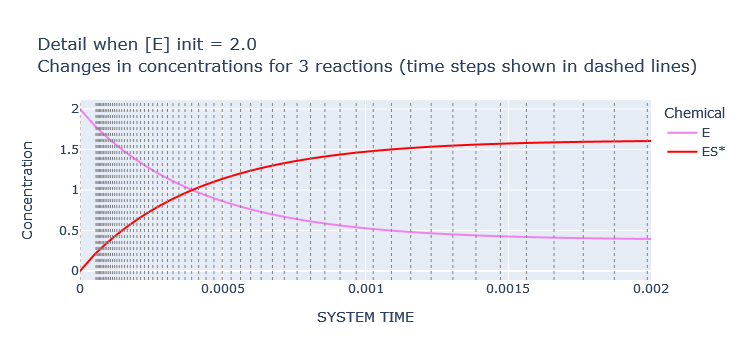

In [57]:
#The very early part of the reaction
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"Detail when [E] init = {E_init}", xrange=[0, 0.002])

plot_curves() WARNING: Excessive number of vertical lines (819) - only showing 1 every 6 lines


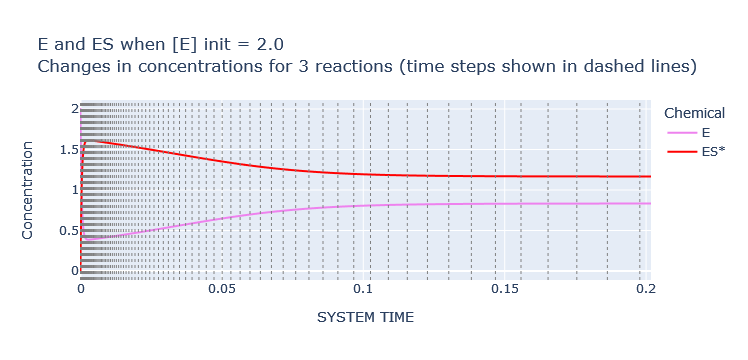

In [58]:
# The full reaction of E and ES*
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"E and ES when [E] init = {E_init}")

In [59]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
818,0.201753,0.832849,1.167151,15.691155


In [60]:
P_equil = dynamics.get_chem_conc("P")
P_equil

15.69115548729148

#### P_equil continues to decrease with increasing initial [E]

In [61]:
P_70_threshold = P_equil * 0.70
P_70_threshold

10.983808841104036

In [62]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.04311547431679562

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# 6. Keep increasing the initial [E]

In [63]:
E_init = 10.0      # 1/2 of the initial [S]

In [64]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init}, snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 10.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [65]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=0.05,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
* INFO: the tentative time step (2.5e-06) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-07) [Step started at t=5e-05, and will rewind there]
836 total step(s) taken


In [66]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (837) - only showing 1 every 6 lines


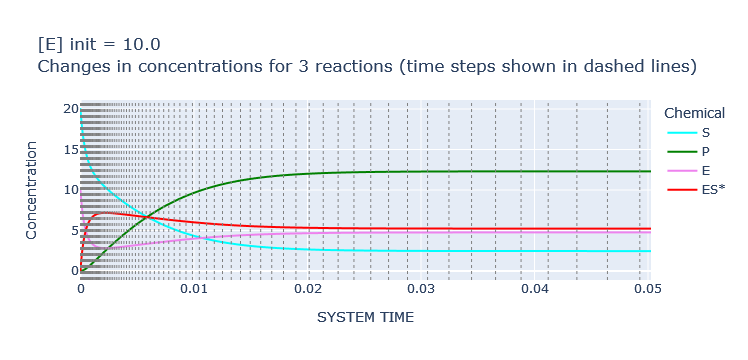

In [67]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [68]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.05)

(0.005877353573479905, 6.680399989705835)

#### The timescale of [S] and [P] continues to become faster with a higher initial [E] -- **AND THEY'RE NOW APPROACHING THE TIMESCALES OF E AND ES**

plot_curves() WARNING: Excessive number of vertical lines (837) - only showing 1 every 6 lines


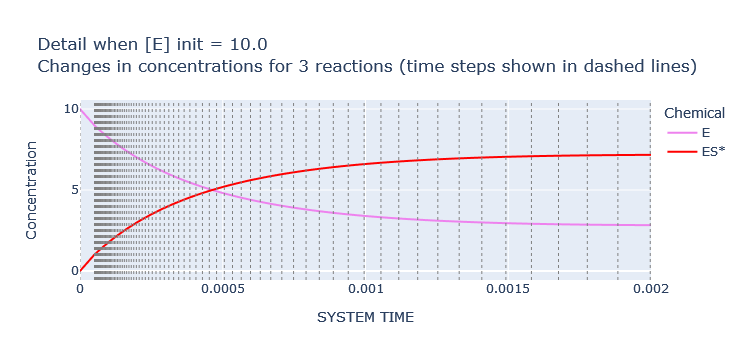

In [69]:
#The very early part of the reaction
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"Detail when [E] init = {E_init}", xrange=[0, 0.002])

plot_curves() WARNING: Excessive number of vertical lines (837) - only showing 1 every 6 lines


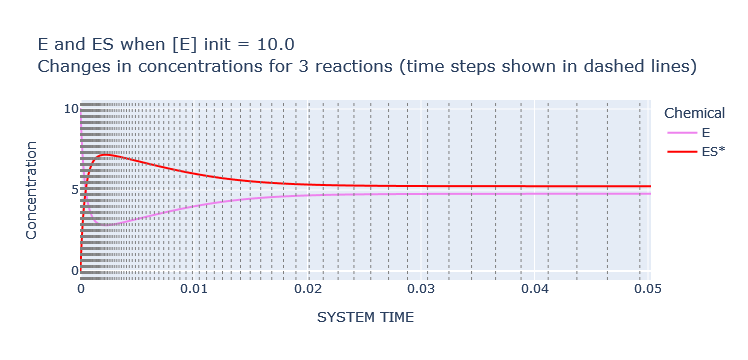

In [70]:
# The full reaction of E and ES*
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"E and ES when [E] init = {E_init}")

#### Notice that at these higher initial concentrations of [E], we're now beginning to see overshoots in [E] and [ES*]

In [71]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
836,0.050265,4.765697,5.234303,12.304598


In [72]:
P_equil = dynamics.get_chem_conc("P")
P_equil

12.304597774138907

#### P_equil continues to decrease with increasing initial [E]

In [73]:
P_70_threshold = P_equil * 0.70
P_70_threshold

8.613218441897235

In [74]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.008274545666098492

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# 7. Keep increasing the initial [E]

In [75]:
E_init = 20.0      # Same as the initial [S]

In [76]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init}, snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 20.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [77]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=0.02,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (2.5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-06) [Step started at t=5e-05, and will rewind there]
* INFO: the tentative time step (2.5e-06) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-07) [Step started at t=5e-05, and will rewind there]
Some steps were backtracked and re-done, to prevent negative concentrations or excessively large concentration changes
757 total step(s) taken


In [78]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (758) - only showing 1 every 6 lines


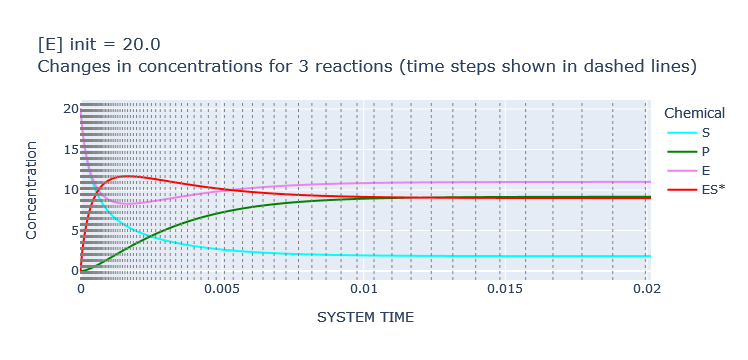

In [79]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [80]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.02)

(0.0024715441102170356, 4.283809315596441)

#### The timescale of [S] and [P] continues to become faster with a higher initial [E] -- **AND THEY'RE NOW GETTING CLOSE THE TIMESCALES OF E AND ES**

plot_curves() WARNING: Excessive number of vertical lines (758) - only showing 1 every 6 lines


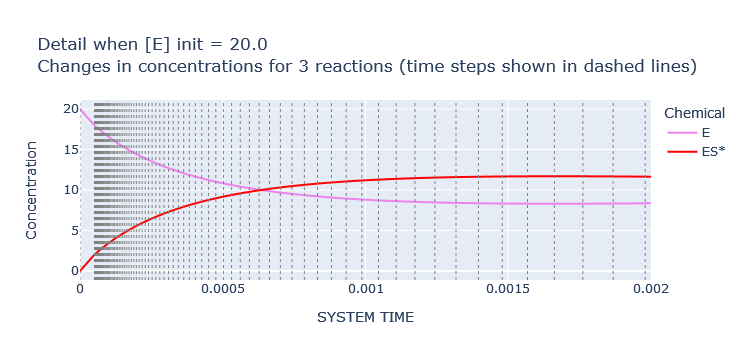

In [81]:
#The very early part of the reaction
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"Detail when [E] init = {E_init}", xrange=[0, 0.002])

plot_curves() WARNING: Excessive number of vertical lines (758) - only showing 1 every 6 lines


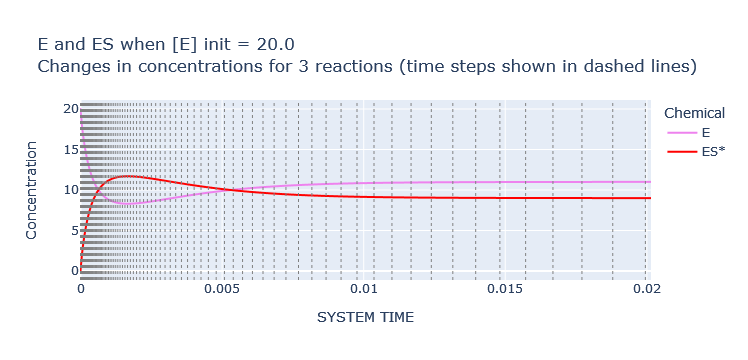

In [82]:
# The full reaction of E and ES*
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"E and ES when [E] init = {E_init}")

#### At these higher initial concentrations of [E], we're now beginning to see overshoots in [E] and [ES*] that overlap less

In [83]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
757,0.020147,10.998147,9.001853,9.163739


In [84]:
P_equil = dynamics.get_chem_conc("P")
P_equil

9.163739207468186

#### P_equil continues to decrease with increasing initial [E]

In [85]:
P_70_threshold = P_equil * 0.70
P_70_threshold

6.41461744522773

In [86]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.004076150862005783

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# 8. Keep increasing the initial [E]

In [87]:
E_init = 30.0      # 50% higher than the initial [S]

In [88]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init}, snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 30.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [89]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=0.01,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5e-06) [Step started at t=0, and will rewind there]
* INFO: the tentative time step (5.05e-06) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5.05e-07) [Step started at t=5e-06, and will rewind there]
Some steps were backtracked and re-done, to prevent negative concentrations or excessively large concentration changes
749 total step(s) taken


In [90]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (750) - only showing 1 every 6 lines


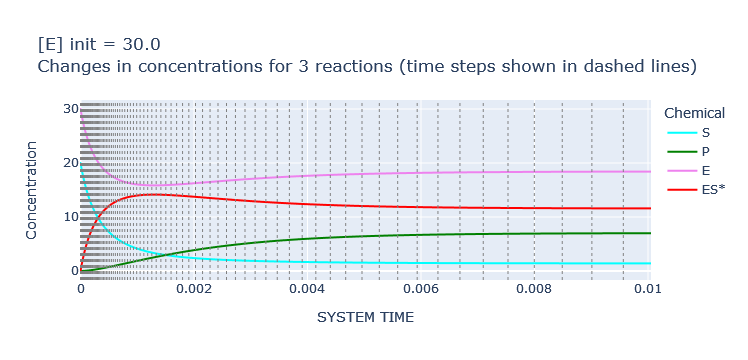

In [91]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [92]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.01)

(0.0015007776137844029, 2.9518860757696133)

#### The timescale of [S] and [P] continues to become faster with a higher initial [E] -- **AND THEY'RE NOW COMPARABLE THE TIMESCALES OF E AND ES**

plot_curves() WARNING: Excessive number of vertical lines (750) - only showing 1 every 6 lines


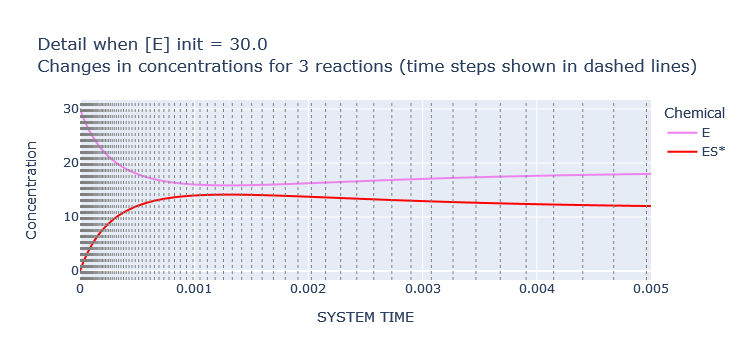

In [93]:
#The very early part of the reaction
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"Detail when [E] init = {E_init}", xrange=[0, 0.005])

plot_curves() WARNING: Excessive number of vertical lines (750) - only showing 1 every 6 lines


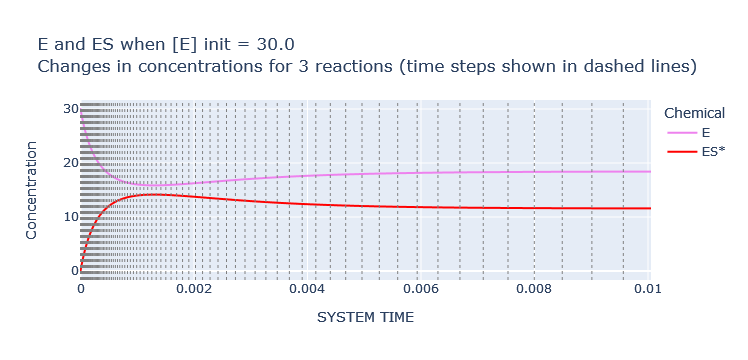

In [94]:
# The full reaction of E and ES*
dynamics.plot_history(chemicals=['E', 'ES*'], colors=['violet', 'red'], show_intervals=True, 
                      title_prefix=f"E and ES when [E] init = {E_init}")

#### At these high initial concentrations of [E], we're now beginning to see [E] and [ES*] no longer overlapping; the overshoot is still present in both

In [95]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
749,0.010054,18.411337,11.588663,6.998847


In [96]:
P_equil = dynamics.get_chem_conc("P")
P_equil

6.998846772430818

#### P_equil continues to decrease with increasing initial [E]

In [97]:
P_70_threshold = P_equil * 0.70
P_70_threshold

4.899192740701572

In [98]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.002747856201107546

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# 9. Keep increasing the initial [E]

In [99]:
E_init = 60.0      # Triple the initial [S]

In [100]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init}, snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 60.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [101]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=0.005,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5e-06) [Step started at t=0, and will rewind there]
* INFO: the tentative time step (5e-06) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5e-07) [Step started at t=5e-06, and will rewind there]
* INFO: the tentative time step (5e-07) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5e-08) [Step started at t=5e-06, and will rewind there]
Some steps were backtracked and re-done, to prevent negative concentrations or excessively large concentration changes
770 total step(s) taken


In [102]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (771) - only showing 1 every 6 lines


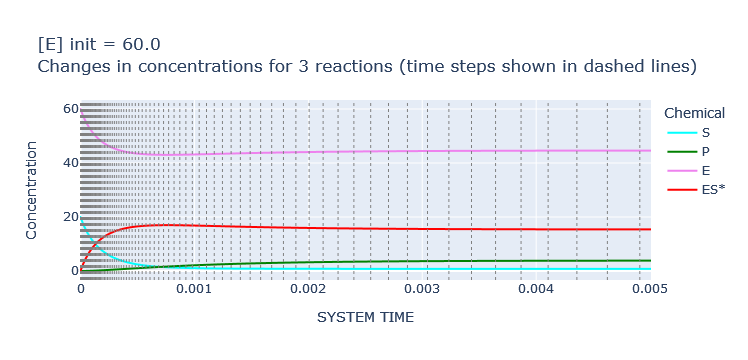

In [103]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [104]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.005)

(0.0007023910558856093, 1.5191639777843677)

#### The timescales of [S] and [P] continues to become faster with a higher initial [E] -- **AND NOW THEY REMAIN COMPARABLE THE TIMESCALES OF E AND ES**

#### At these high initial concentrations of [E],  [E] and [ES*] no longer overlapping, and are now getting further apart

In [105]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
770,0.005008,44.60637,15.39363,3.832618


In [106]:
P_equil = dynamics.get_chem_conc("P")
P_equil

3.832618199402545

#### P_equil continues to decrease with increasing initial [E]

In [107]:
P_70_threshold = P_equil * 0.70
P_70_threshold

2.682832739581781

In [108]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.001390053726276219

#### The time at which we reach the 70% threshold of the equilibrium value of P continues to decrease with increasing initial [E]

# 10. Keep increasing the initial [E]

In [109]:
E_init = 100.0      # Quintuple the initial [S]

In [110]:
dynamics = UniformCompartment(chem_data=chem_data, preset="slower")      # A brand-new simulation, with the same chemicals and reactions as before

dynamics.set_conc(conc={"S": 20., "E": E_init}, snapshot=True)     
dynamics.describe_state()

SYSTEM STATE at Time t = 0:
4 species:
  Species 0 (S). Conc: 20.0
  Species 1 (P). Conc: 0.0
  Species 2 (E). Conc: 100.0
  Species 3 (ES*). Conc: 0.0
Set of chemicals involved in reactions: {'ES*', 'P', 'S', 'E'}


In [111]:
# Perform the reactions (The duration of the run was manually adjusted for optimal visibility)
dynamics.single_compartment_react(duration=0.003,
                                  initial_step=0.00005, variable_steps=True, explain_variable_steps=False)

* INFO: the tentative time step (5e-05) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 5e-06) [Step started at t=0, and will rewind there]
* INFO: the tentative time step (2.5e-06) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-07) [Step started at t=5e-06, and will rewind there]
* INFO: the tentative time step (2.5e-07) leads to a least one norm value > its ABORT threshold:
      -> will backtrack, and re-do step with a SMALLER delta time, multiplied by 0.1 (set to 2.5e-08) [Step started at t=5e-06, and will rewind there]
Some steps were backtracked and re-done, to prevent negative concentrations or excessively large concentration changes
785 total step(s) taken


In [112]:
# Verify that the reactions have reached equilibrium
dynamics.is_in_equilibrium(verbose=False)

True

plot_curves() WARNING: Excessive number of vertical lines (786) - only showing 1 every 6 lines


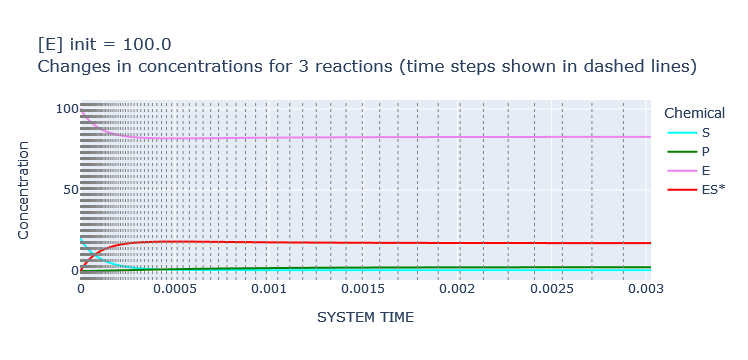

In [113]:
dynamics.plot_history(colors=['cyan', 'green', 'violet', 'red'], show_intervals=True, 
                      title_prefix=f"[E] init = {E_init}")

In [114]:
# Locate the intersection of the curves for [S] and [P]:
dynamics.curve_intersect("S", "P", t_start=0, t_end=0.005)

(0.0004266715141239805, 0.9491814221946882)

#### The timescales of [S] and [P] continues to become faster with a higher initial [E] -- **AND REMAIN COMPARABLE TO THE TIMESCALES OF E AND ES**

#### At these high initial concentrations of [E],  [E] and [ES*] no longer overlapping, and are now getting further apart

In [115]:
dynamics.get_history(columns=['SYSTEM TIME', 'E', 'ES*', 'P'], tail=1)  # Last point in the simulation

,SYSTEM TIME,E,ES*,P
785,0.003028,82.779099,17.220901,2.312829


In [116]:
P_equil = dynamics.get_chem_conc("P")
P_equil

2.3128291895441793

#### P_equil continues to decrease with increasing initial [E]

In [117]:
P_70_threshold = P_equil * 0.70
P_70_threshold

1.6189804326809254

In [118]:
dynamics.reach_threshold(chem="P", threshold=P_70_threshold)

0.0008229365407830671

# CONCLUSION:  
### as the initial concentration of the Enzyme E increases from zero to lavish values much larger that the concentration of the Substrate S, the reaction keeps reaching an equilibrium faster and faster...  
#### BUT the equilibrium concentration of the Product P steadily _reduces_ - and ES*, far from being transient, actually builds up.   
#### The **strange world of departing from the customary Michaelis-Menten assumptions** that [E] << [S] and that the rates satisfy k1_reverse >> k2_forward !

In [119]:
dynamics.get_history(head=1)  # First point in the simulation

,SYSTEM TIME,S,P,E,ES*,caption
0,0.0,20.0,0.0,100.0,0.0,Initialized state


In [120]:
dynamics.get_history(tail=1)  # Last point in the simulation

,SYSTEM TIME,S,P,E,ES*,caption
785,0.003028,0.46627,2.312829,82.779099,17.220901,


### When the initial [E] is quite high, relatively little of the reactant S goes into making the product P ; most of S binds with the abundant E, to produce a lasting ES* 
The following manual stoichiometry check illustrates it.

#### Manual overall STOICHIOMETRY CHECK:

In [121]:
delta_S = 0.46627 - 20.0
delta_S

-19.53373

In [122]:
delta_E = 82.779099 - 100.0
delta_E

-17.220900999999998

In [123]:
delta_E = 82.779099 - 100.0
delta_E

-17.220900999999998

In [124]:
delta_ES = 17.220901 - 0
delta_ES

17.220901

In [125]:
chem_data.describe_reactions()

Number of reactions: 3 (at temp. 25 C)
0: S <-> P  (kF = 1 / kR = 0.2 / delta_G = -3,989.7 / K = 5) | 1st order in all reactants & products
1: E + S <-> ES*  (kF = 100 / kR = 224.07 / delta_G = 2,000 / K = 0.44629) | 1st order in all reactants & products
2: ES* <-> E + P  (kF = 200 / kR = 17.851 / delta_G = -5,989.7 / K = 11.204) | 1st order in all reactants & products
Set of chemicals involved in the above reactions: {'ES*', 'P', 'S', 'E'}


19.53373 units of `S` are consumed : a meager 2.312829 of that goes into the production of `P` (rxn 0)  ; the remainder of Delta S is:

In [126]:
19.53373 - 2.312829

17.220900999999998

That extra Delta S of 17.2209 combines with an equal amount of `E` to produce the same amount, 17.2209, of ES* (rxn 1)  

`E`, now depleted by that amount of 17.2209, reaches the value:

In [127]:
100 - 17.2209

82.7791

In [128]:
# Also review that the chemical equilibrium holds, with the final simulation values
dynamics.is_in_equilibrium()

0: S <-> P
Final concentrations: [S] = 0.4663 ; [P] = 2.313
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 4.96028
    Formula used:  [P] / [S]
2. Ratio of forward/reverse reaction rates: 5.00001
Discrepancy between the two values: 0.7945 %
Reaction IS in equilibrium (within 1% tolerance)

1: E + S <-> ES*
Final concentrations: [E] = 82.78 ; [S] = 0.4663 ; [ES*] = 17.22
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 0.446167
    Formula used:  [ES*] / ([E][S])
2. Ratio of forward/reverse reaction rates: 0.446288
Discrepancy between the two values: 0.027 %
Reaction IS in equilibrium (within 1% tolerance)

2: ES* <-> E + P
Final concentrations: [ES*] = 17.22 ; [E] = 82.78 ; [P] = 2.313
1. Ratio of reactant/product concentrations, adjusted for reaction orders: 11.1175
    Formula used:  ([E][P]) / [ES*]
2. Ratio of forward/reverse reaction rates: 11.2035
Discrepancy between the two values: 0.7677 %
Reaction IS in equilibrium (within 

True